In [1]:
import scanpy as sc
import rpy2.rinterface_lib.callbacks
import logging

# from rpy2.robjects import pandas2ri
import anndata2ri
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import Colormap, TwoSlopeNorm

In [2]:
# Ignore R warning messages
# Note: this can be commented out to get more verbose R output
# rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams["figure.figsize"] = (8, 8)  # rescale figures
sc.settings.verbosity = 3
# sc.set_figure_params(dpi=200, dpi_save=300)b
sc.set_figure_params(figsize=(5, 5))

In [3]:
%%R
library(progeny)
library(dorothea)
library(dplyr)
library(Seurat)
library(tibble)
library(tidyr)
library(viper)
options(max.print=100)

R[write to console]: 
Attaching package: 'dplyr'


R[write to console]: The following objects are masked from 'package:stats':

    filter, lag


R[write to console]: The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


R[write to console]: Attaching SeuratObject

R[write to console]: Loading required package: Biobase

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: 'BiocGenerics'


R[write to console]: The following objects are masked from 'package:parallel':

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following objects are masked from 'package:dplyr':

    combine, intersect, setdiff, union


R[write to console]: The following objects are masked from 'package:stats':

    IQR

In [4]:
adata = sc.read_h5ad(
    "../../data/20_annotate_all_cells/primary-tumor-annotated-integrated.h5ad"
)

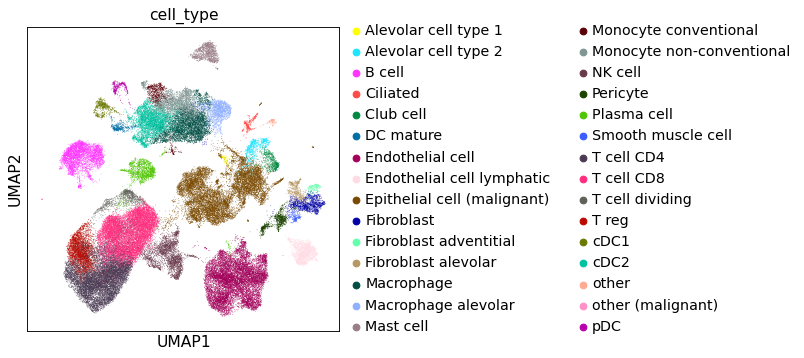

In [5]:
sc.pl.umap(adata, color=["cell_type"])

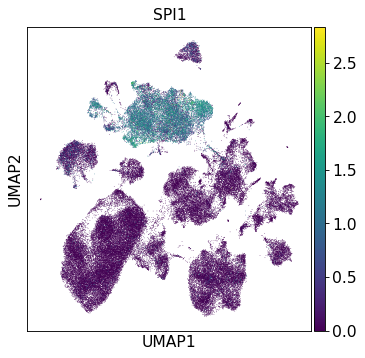

In [6]:
sc.pl.umap(adata, color=["SPI1"])

### Prepare data for dorothea and progeny

In [7]:
%%R 
dorothea_regulon_human <- get(data("dorothea_hs", package = "dorothea"))

regulon <- dorothea_regulon_human %>%
    dplyr::filter(confidence %in% c("A","B"))

In [8]:
# sc.pp.subsample(adata, n_obs=3000)
# for dorothea
adata.layers["logcounts"] = adata.X
# for progeny (even though it's "normcounts", progeny expectes log-transformed data)
adata.layers["normcounts"] = adata.X

# scaling has no effect on dorothea, let's stay sparse!
# scaling has an effect on progeny, but mostly on the scale, not the relative differences. Let's stay sparse. 
# sc.pp.scale(adata, layer="logcounts")

### run progeny

In [9]:
%%R -i adata -o progeny -o pathways -o obs_names
progeny = progeny(
    adata, scale=FALSE, organism="Human", top=500, perm=1, return_assay=TRUE
)
pathways = colnames(progeny)
obs_names = rownames(progeny)

In [10]:
pathways_of_interest = [f"PW:{x}" for x in ["JAK-STAT", "VEGF", "PI3K", "NFkB", "Trail", "TNFa"]]

In [11]:
assert np.all(list(obs_names) == adata.obs_names)
progeny_df = pd.DataFrame(progeny)
progeny_df.columns = [f"PW:{x}" for x in pathways]
progeny_df.index = adata.obs_names
adata.obsm["X_progeny"] = progeny_df
adata.obs = adata.obs.join(adata.obsm["X_progeny"].loc[:, pathways_of_interest])

### run dorothea

In [12]:
%%R
dorothea_res = run_viper(
    adata,
    regulon,
    options=list(method="scale", minsize=4, eset.filter=FALSE, cores=8, verbose=FALSE),
)

In [13]:
%%R -o obs_names -o tfs -o dorothea_mat
alt_exp = altExp(dorothea_res, "dorothea")
obs_names = colnames(alt_exp)
tfs = rownames(alt_exp)
dorothea_mat = assay(alt_exp, "tf_activities")

In [14]:
tfs_of_interest = [
    f"TF:{tf}" for tf in ["SPI1", "NFKB1", "STAT1", "MYC", "E2F4", "E2F2", "ZNF263"]
]

In [15]:
assert np.all(list(obs_names) == adata.obs_names)
dorothea_df = pd.DataFrame(dorothea_mat.T)
dorothea_df.columns = [f"TF:{tf}" for tf in tfs]
dorothea_df.index = adata.obs_names
adata.obsm["X_dorothea"] = dorothea_df
adata.obs = adata.obs.join(dorothea_df.loc[:, tfs_of_interest])

## Export adata

In [16]:
adata.write_h5ad("../../data/40_dorothea_progeny/40_primary_tumor_dorothea_progeny.h5ad", compression="lzf")

## Visualize
### Transcription factors

In [17]:
# fake adata object for stacked violin
tmp_adata = sc.AnnData(X=dorothea_df.values.copy(), obs=adata.obs.loc[:, ["cell_type"]])
tmp_adata.var_names = dorothea_df.columns

In [18]:
sc.pp.scale(tmp_adata)

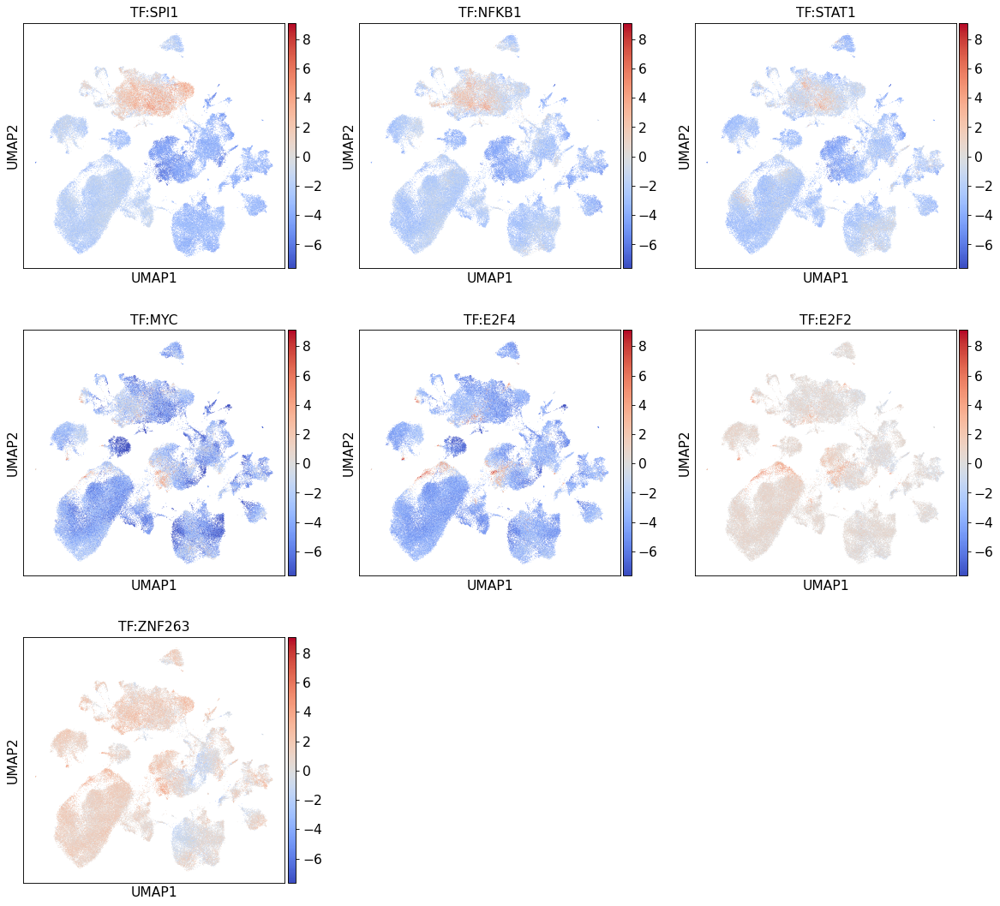

In [19]:
norm = TwoSlopeNorm(0, vmin=np.min(tmp_adata.X), vmax=np.max(tmp_adata.X))
sc.pl.umap(adata, color=tfs_of_interest, ncols=3, cmap="coolwarm", norm=norm)

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:06)
Storing dendrogram info using `.uns['dendrogram_cell_type']`


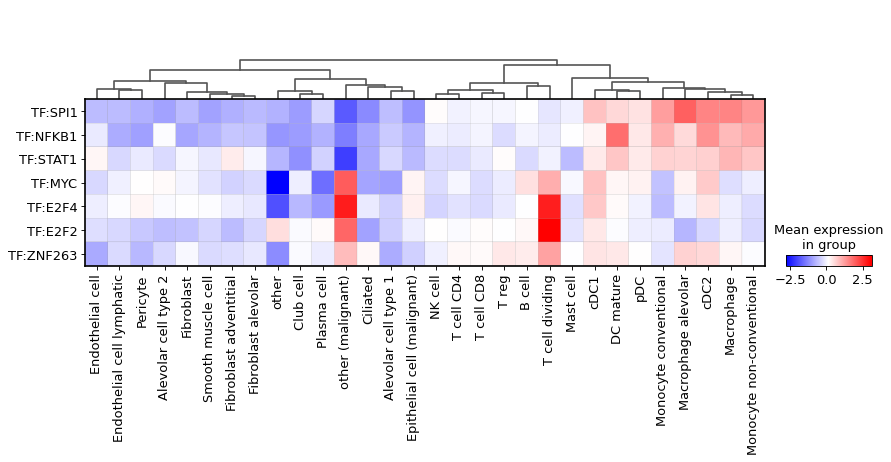

In [20]:
sc.pl.matrixplot(
    tmp_adata,
    groupby="cell_type",
    var_names=tfs_of_interest,
    swap_axes=True,
    dendrogram=True,
    cmap="bwr"
)

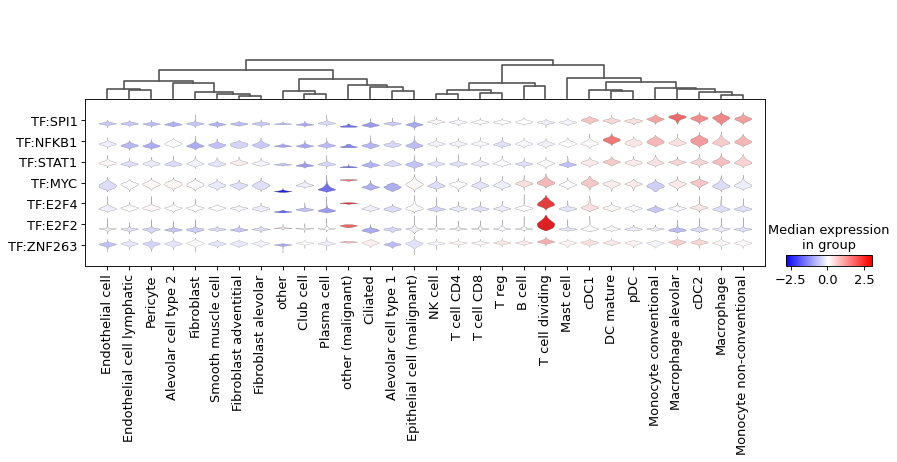

In [21]:
sc.pl.stacked_violin(
    tmp_adata, groupby="cell_type", var_names=tfs_of_interest, swap_axes=True, dendrogram=True, cmap="bwr"
)

### Pathways

In [22]:
# fake adata object for stacked violin
tmp_adata = sc.AnnData(X=progeny_df.values.copy(), obs=adata.obs.loc[:, ["cell_type"]], obsm=adata.obsm)
tmp_adata.var_names = progeny_df.columns

In [23]:
sc.pp.scale(tmp_adata)

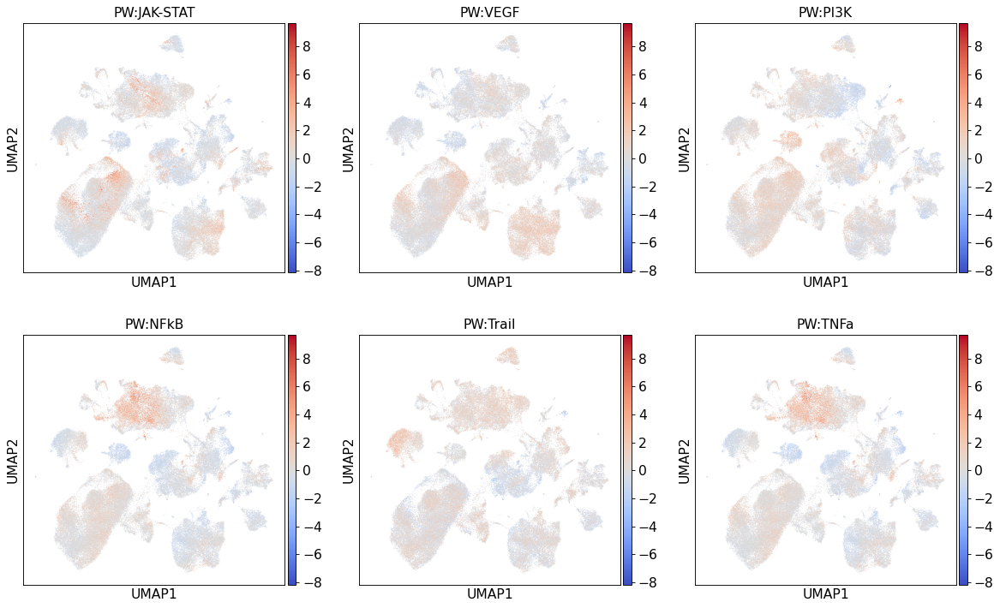

In [24]:
norm = TwoSlopeNorm(0, vmin=np.min(tmp_adata.X), vmax=np.max(tmp_adata.X))
sc.pl.umap(tmp_adata, color=pathways_of_interest, ncols=3, norm=norm, cmap="coolwarm")

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_cell_type']`


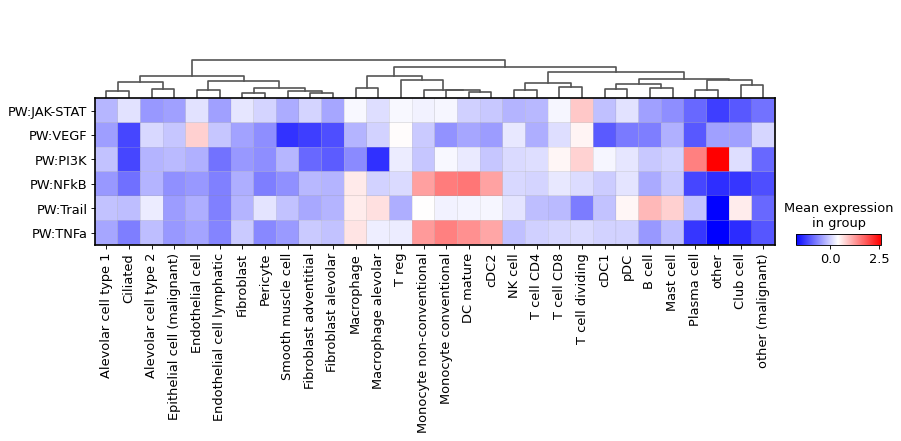

In [25]:
sc.pl.matrixplot(
    tmp_adata,
    groupby="cell_type",
    var_names=pathways_of_interest,
    swap_axes=True,
    dendrogram=True,
    cmap="bwr",
)

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:50)
Storing dendrogram info using `.uns['dendrogram_cell_type']`


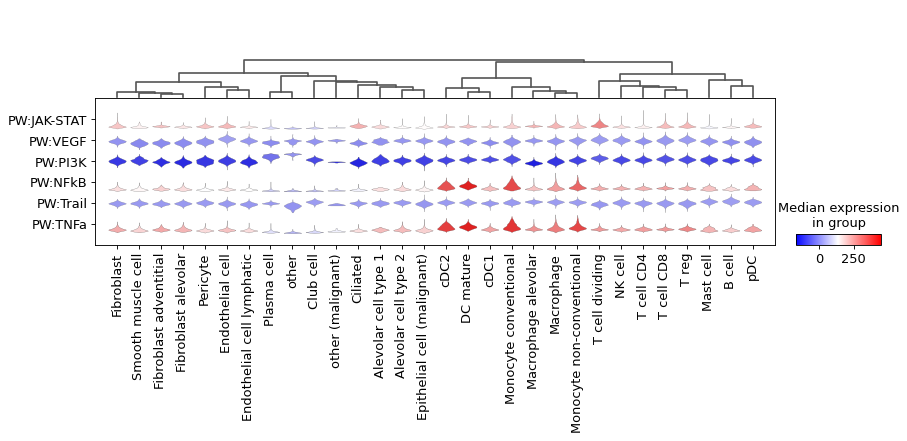

In [26]:
sc.pl.stacked_violin(
    adata,
    groupby="cell_type",
    var_names=pathways_of_interest,
    swap_axes=True,
    dendrogram=True,
    cmap="bwr",
)

### Genes

In [27]:
%%R -o genes_of_interest
genes_of_interest = regulon$target[regulon$tf=="SPI1"]

In [28]:
genes_of_interest = list(genes_of_interest) + ["TREM2", "SPI1"]

In [29]:
genes_of_interest = list(set(genes_of_interest) & set(adata.var_names.values))

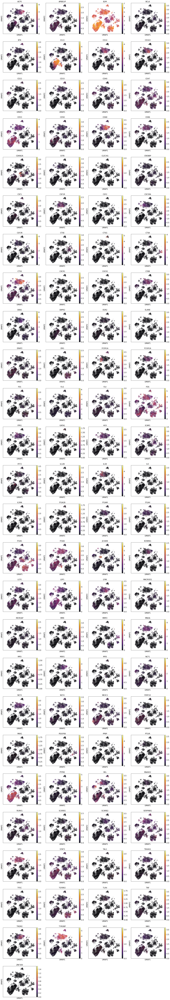

In [30]:
sc.pl.umap(adata, color=sorted(genes_of_interest), cmap="inferno")

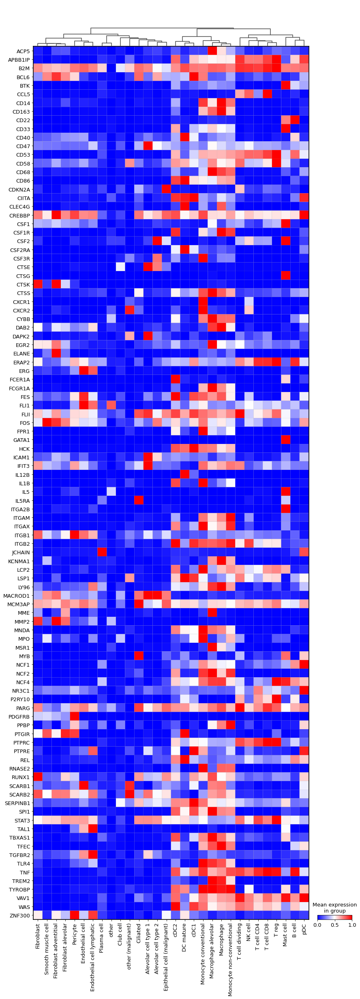

In [31]:
sc.pl.matrixplot(
    adata,
    groupby="cell_type",
    var_names=sorted(genes_of_interest),
    swap_axes=True,
    dendrogram=True,
    cmap="bwr",
    standard_scale="var"
)